<font face="B Mitra" size=4>
<div dir=rtl align=center>

<br>
<img src="https://aut.ac.ir/templates/tmpl_modern01/images/logo_fa.png" alt="Amirkabir University Logo" width="100">

<br>
<font size=2>
<b>دانشگاه صنعتی امیرکبیر - دانشکده ریاضی و علوم کامپیوتر</b>
</font>

<br>
<font size=6>
<b>مقدمه‌ای بر پردازش تصویر</b>
</font>

<br>
<hr/>
<font size=6>
<b>کارگاه اول: مقدمات OpenCV</b>
</font>

<br>
استاد: دکتر مصطفی شمسی

<br>
طراح:‌ کیارش مختاری

<hr>
</div>
</font>


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
لطفا فایل نوت بوک نهایی را با الگوی زیر در سامانه کورسز آپلود کنید.
</font>
</p>

<div dir=ltr>
<font face="Times New Roman" size=4 dir=ltr>
شماره دانشجویی-Image Processing-Workshop1.ipynb
</font>
</div>

</div>
</font>

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=6>
<b>OpenCV چیست؟</b>
</font>

<br>
<p align="justify">
<font size=4>
OpenCV یک کتابخانه منبع باز قدرتمند برای پردازش تصویر و بینایی ماشین است که توسط مجموعه‌ای از ابزارها و توابع برنامه‌نویسی، امکان تشخیص و تحلیل تصاویر و ویدیوها را فراهم می‌کند. این کتابخانه توسط Willow Garage توسعه یافته و در حال حاضر توسط یک جامعه گسترده از برنامه‌نویسان و محققان در سراسر جهان حمایت می‌شود.
از کاربردهای اصلی OpenCV می‌توان به موارد زیر اشاره کرد:
<ol>
  <li>تشخیص چهره</li>
  <li>تعقیب اشیاء</li>
  <li>تشخیص شیء</li>
  <li>برچسب‌گذاری تصاویر</li>
  <li>پردازش تصاویر پزشکی</li>
</ol>
</font>
</p>

</div>
</font>

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=6>
<b>عملیات مقدماتی در OpenCV:</b>
</font>

<br>
<p>
<font size=4>
در این کارگاه قصد داریم مطالب زیر را پوشش دهیم:
<ol>
  <li>خواندن و نمایش تصاویر</li>
  <li>دسترسی به مقادیر پیکسل و تغییر آنها</li>
  <li>دسترسی به ویژگی های تصویر</li>
  <li>تنظیم ناحیه مورد نظر از تصویر</li>
  <li>تقسیم و ادغام کانال‌های تصاویر</li>
  <li>عملیات حسابی بر روی تصاویر</li>
  <li>عملیات ابتدایی در پردازش تصویر</li>
  <li>کنتراست و روشنایی</li>
</ol>
نکته: در این کارگاه علاوه بر OpenCV از کتابخانه‌های
<a href="https://numpy.org/doc/stable/">numpy</a> و
<a href="https://matplotlib.org/stable/users/index.html">matplotlib</a>
استفاده شده است.
</font>
</p>
<hr/>
</div>
</font>

<font face="B Mitra">
<div dir=rtl>

<font size=5>
<b>بارگذاری کتابخانه‌ها و توابع کمکی مورد نیاز</b>
</font>

</div>
</font>

In [2]:
import cv2
import math
import requests # For reading image from URL
import numpy as np
import matplotlib.pylab as plt
from google.colab.patches import cv2_imshow # For displaying image in Google Colab

def read_image_from_url(url):
    # Fetch the content from the url
    response = requests.get(url)
    # Check if the request was successful
    response.raise_for_status()
    # Convert the response content to a numpy array and then to a OpenCV BGR image
    image = cv2.imdecode(np.asarray(bytearray(response.content), dtype="uint8"), cv2.IMREAD_COLOR)
    return image

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۱. خواندن و نمایش تصاویر</b>
</font>

<br>
<p align="justify">
<font size=4>
در این مرحله قصد داریم تصاویر را از URL‌های
مختلف بخوانیم و سپس آنها را نمایش دهیم.

نکته ۱: هنگام خواندن تصاویر به تفاوت‌های BGR و RGB دقت کنید.
در OpenCV کانال‌های ورودی برای خواند تصاویر به صورت پیشفرض BGR می‌باشد. مثلا در تصاویر پایین، تصویر سمت راستی که در قالب RGB می‌باشد و هنگامی که به OpenCV داده می‌شود که این تصویر را بخواند، تصویر به درستی نمایش داده نمی‌شود.

<font size=4>
نکته ۲: بدلیل استفاده از Google Colab و URL تصاویر، امکان استفاده از قطعه کد‌های زیر جهت خواندن و نمایش تصویر نیست اما می‌توانید این دستور‌ها را در ادیتور خود امتحان کنید.
</font>

خواندن تصویر:
<div dir=ltr>
<font size=5>
<code>
cv2.imread("image location", a flag which specifies the way image should be read.)
</code>
</font>
</div>

<font face="Times New Roman" size=4 dir=ltr>
<ul>
flags:
<li>cv2.IMREAD_COLOR: Loads a color image. Any transparency of image will be neglected. It is the default flag.</li>
<li>cv2.IMREAD_GRAYSCALE: Loads image in grayscale mode</li>
<li>cv2.IMREAD_UNCHANGED: Loads image as such including alpha channel</li>
</ul>
</font>

نمایش تصاویر:
<div dir=ltr>
<font size=5>
<code>
cv2.imshow("window name", our image variable) <br>
cv2.waitKey(0) # The function waits for specified milliseconds for any keyboard event. If 0 is passed, it waits indefinitely for a key stroke.<br>
cv2.destroyAllWindows() # Simply destroys all the windows we created.
</code>
</font>
</div>

</font>
</p>

</div>
</font>

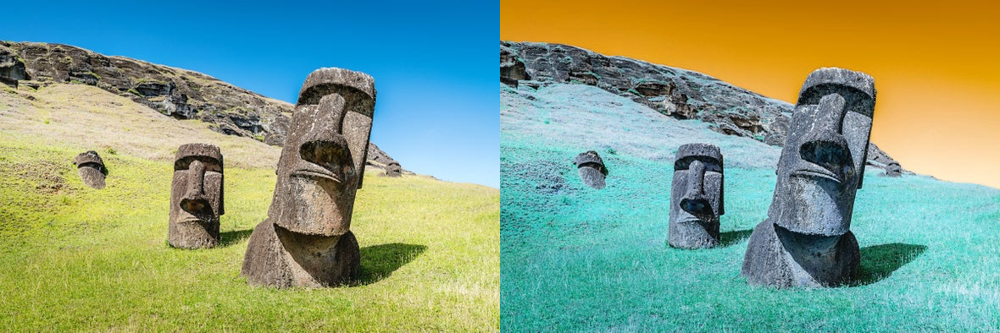

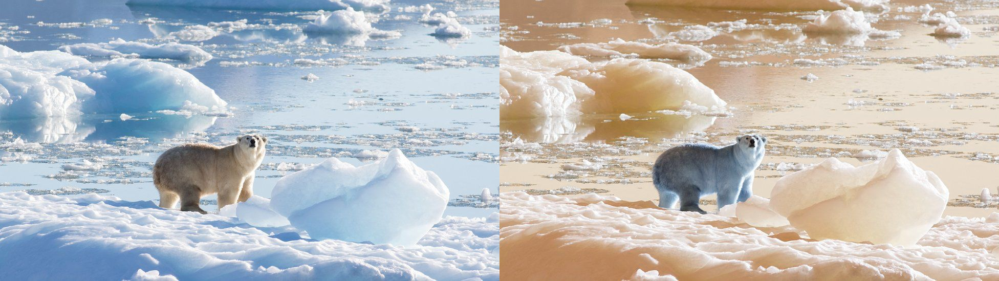

In [60]:
# Create a list to store the urls of the images
urls = ["https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6",
        "https://ichef.bbci.co.uk/news/976/cpsprodpb/14591/production/_125454338_11d9fae1beaf4ea3afbe3986a43bea758df8a8e5.jpg"]

for url in urls:
  image = read_image_from_url(url) # Read the image from URL using OpenCV + requests
  image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert from BGR to RGB channel
  final_frame = cv2.hconcat((image, image_2)) # Concatenate the BGR image to RGB image
  cv2_imshow(final_frame) # Display the image
  print('\n')

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۱:</b>
</font>

<br>
<p>
<font size=4>
حال که با نحوه خواندن و نمایش تصاویر آشنا شدید، به دلخواه آدرس یک تصویر را کپی کرده و آنرا در هر دو فرمت RGB و BGR نمایش دهید.
</font>
</p>

</div>
</font>

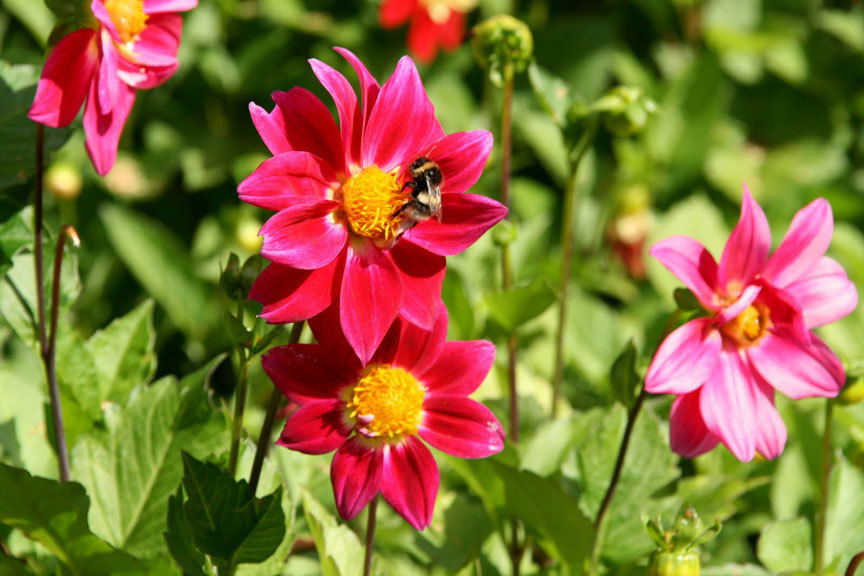

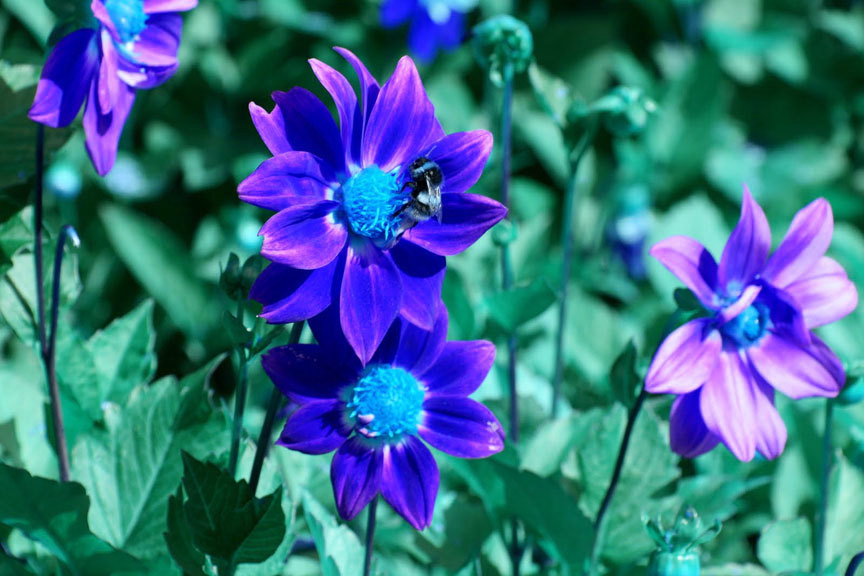

In [17]:
## TODO1: Read and Display an image
url = "https://res.cloudinary.com/demo/image/upload/v1312461204/sample.jpg"
myImg = read_image_from_url(url)
### START
cv2_imshow(myImg) # BGR image output
myImg2 = cv2.cvtColor(myImg, cv2.COLOR_BGR2RGB) # Convert to RGB
cv2_imshow(myImg2)# RGB image output
### END

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۲. دسترسی به مقادیر پیکسل و تغییر آنها</b>
</font>

<br>
<p>
<font size=4>
شما می‌توانید به مقدار یک پیکسل با استفاده از مختصات ردیف و ستون آن دسترسی پیدا کنید. برای تصویر BGR، آرایه‌ای از مقادیر آبی، سبز، قرمز را برمی‌گرداند. برای تصویر خاکستری، فقط شدت متناظر برگردانده می‌شود.
</font>
</p>

<br>
<div style="display: flex; justify-content: center;">
  <img src="https://static.packt-cdn.com/products/9781789344912/graphics/assets/ef884cf4-46f9-4db1-b473-ed80ecbc2593.png" alt="Image 1" width="400">
  <img src="https://static.packt-cdn.com/products/9781789344912/graphics/assets/a4bb6560-4c40-4de2-b88f-8e08b69cf7ab.png" alt="Image 2" width="400">
</div>

</div>
</font>

In [61]:
url = "https://static.scientificamerican.com/sciam/cache/file/DB4E849F-5267-4A4C-A8A1F8AB1344C945_source.jpg?w=590&h=800&8397FFEE-1F26-49BC-98ECB53FE3F8A6D6"
img = read_image_from_url(url)

px = img[100,100]
print("Pixel(100,100)(Blue, Green, Red):",px)

# accessing only blue pixel
blue = img[100,100,0]
print("Blue:", blue)

Pixel(100,100)(Blue, Green, Red): [157 193 201]
Blue: 157


<font face="B Mitra" size=5>
<div dir=rtl>

<br>
<p>
<font size=4>
همچنین ما می‌توانیم مقادیر یک پیکسل را تغییر دهیم. اما دسترسی به هر یک از مقادیر پیکسل و تغییر آن بسیار روشی کند است و صرفا برای درک مفاهیم در اینجا ذکر شده است.

</div>
</font>

In [ ]:
print("‌‌Bfore editing pixel:", px)
px = [0, 0, 0]
print("After editing pixel:", px)

‌‌Bfore editing pixel: [157 193 201]
After editing pixel: [0, 0, 0]


<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۳. دسترسی به ویژگی های تصویر</b>
</font>

<br>
<p>
<font size=4>
ویژگی های تصویر شامل تعداد سطر، ستون، کانال، نوع داده های تصویری، تعداد پیکسل و غیره.

اگر تصویر رنگی باشد دستور <code>shape</code> یک tuple از تعداد سطر و ستون و تعداد کانال‌های تصویر به ما می‌دهد. و اگر تصویر grayscale باشد یک tuple از تعداد سطر و ستون را خروجی می‌دهد.
</font>
</p>


</div>
</font>

In [ ]:
print("Image shape(#row, #column, #channel):", img.shape)

Image shape(#row, #column, #channel): (394, 590, 3)


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
برای فهمیدن تعداد پیکسل‌های یک تصویر از دستور <code>size</code> استفاده می‌کنیم.
</font>
</p>


</div>
</font>

In [ ]:
print("# Pixels:", img.size)

# Pixels: 697380


<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
برای فهمیدن نوع داده یک تصویر از دستور <code>dtype</code> استفاده می‌کنیم.
</font>
</p>


</div>
</font>

In [ ]:
print("Image datatype:",img.dtype)

Image datatype: uint8


<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۴. تنظیم ناحیه مورد نظر از تصویر</b>
</font>

<br>
<p>
<font size=4>
گاهی اوقات، شما باید با مناطق خاصی از تصاویر بازی کنید. برای تشخیص چشم در تصاویر، ابتدا تشخیص چهره در کل تصویر انجام می‌شود. وقتی چهره‌ای به دست می‌آید، ناحیه صورت را به تنهایی انتخاب می‌کنیم و به جای جستجوی کل تصویر، چشم‌ها را در داخل آن جستجو می‌کنیم. زیرا دقت را بهبود می‌بخشد (چون چشم‌ها همیشه روی صورت هستند) و سرعت را افزایش می‌دهد (زیرا ما در یک منطقه کوچک جستجو می‌کنیم).

به عنوان مثال به شکل زیر توجه کنید:

نکته: کانال‌های ورودی در matplotlib به صورت RGB می‌باشد بنابراین برای نمایش تصاویر با matplotlib که با استفاده از OpenCV خوانده شده‌اند باید ابتدا تصویر را به RGB تبدیل کنیم و سپس آن را با matplotlib نمایش دهیم.
</font>
</p>


</div>
</font>

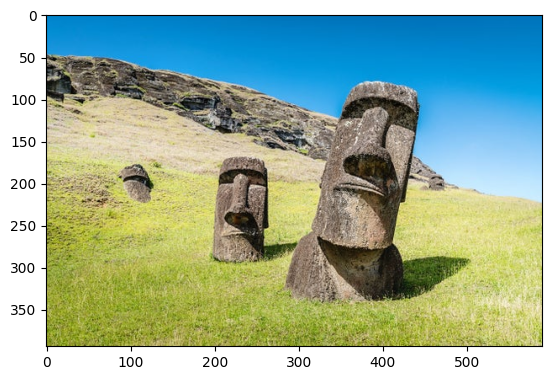

In [62]:
img2 = img
new_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Convert the image to RGB
plt.imshow(new_img)

<font face="B Mitra" size=5>
<div dir=rtl>

<p>
<font size=4>
حال ما میخواهیم یکی کپی از یکی از مجسمه‌ها در تصویر ایجاد کنیم.
</font>
</p>


</div>
</font>

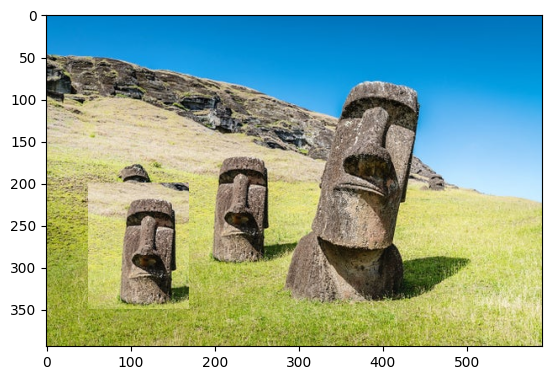

In [ ]:
statue = new_img[150:300, 160:280]
new_img[200:350, 50:170] = statue
plt.imshow(new_img)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۲:</b>
</font>

<br>
<p>
<font size=4>
توپ موجود در تصویر را در یک ناحیه به دلخواه کپی و در آخر آن را نمایش دهید.
</font>
</p>

</div>
</font>

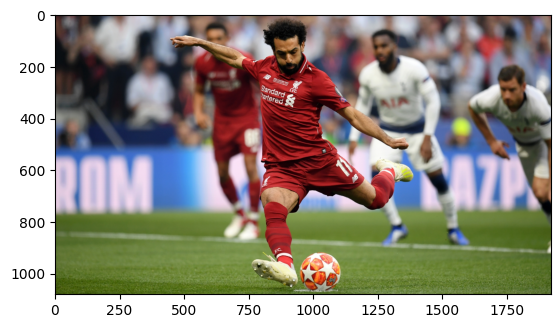

In [77]:
url = "https://www.soccer-training-methods.com/images/salahkicking.jpg"
test_img = read_image_from_url(url)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)
plt.imshow(test_img)

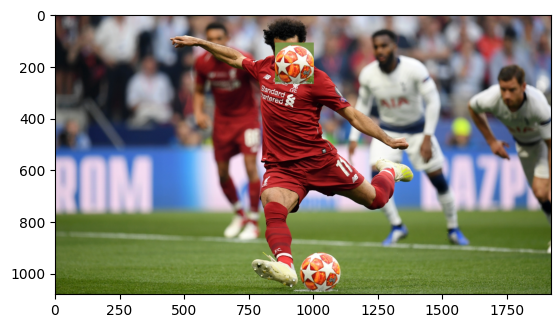

In [78]:
## TODO2: Image ROI
ball = test_img[910:1070, 950:1100]
test_img[110:270, 850:1000] = ball
plt.imshow(test_img)

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۵. تقسیم و ادغام کانال‌های تصاویر</b>
</font>

<br>
<p>
<font size=4>
گاهی اوقات لازم است به طور جداگانه روی کانال‌های B، G، R یک تصویر کار کنید. در این مورد، باید تصویر BGR را به کانال های جدا تقسیم کنید. در موارد دیگر، ممکن است لازم باشد برای ایجاد یک تصویر BGR این کانال‌ها را در کنار هم قرار دهید.

همانطور که مشاهده می‌کنید کانال‌های تصویر را جدا کرده‌ایم و تصویر کانال آبی را به نمایش گذاشتیم. دقت کنید که تصویر grayscale شده شدت رنگ آبی را به ما نشان میدهد برای درک بیشتر می‌توانید تصویر قرمز (r) را خروجی بگیرید و ببینید که چه تغییری در تصویر ایجاد می‌شود.
</font>
</p>


</div>
</font>

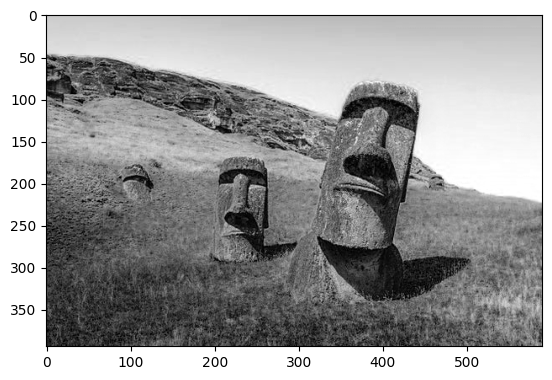

In [79]:
# split channels
b,g,r=cv2.split(img2)
# show one of the channels (this is blue - see that the sky is kind of dark. try changing it to r)
plt.imshow(b, cmap='gray')

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۳</b>
</font>

<br>
<p align="justify">
<font size=4>
با توجه به تصویر که شامل کانال‌های قرمز، سبز، و آبی است، چگونه می‌توانید فقط کانال آبی را به رنگ آبی واقعی نمایش دهید، در حالی که اطمینان حاصل شود که کانال‌های سبز و قرمز در نمایش نهایی مشارکت ندارند؟ لطفا کد خود را در cell زیر بنویسید و خروجی را نشان دهید.

راهنمایی: برای تأکید بر رنگ آبی، شما می‌خواهید مطمئن شوید که کانال‌های سبز و قرمز به صفر تنظیم شده‌اند.
</font>
</p>

</div>
</font>

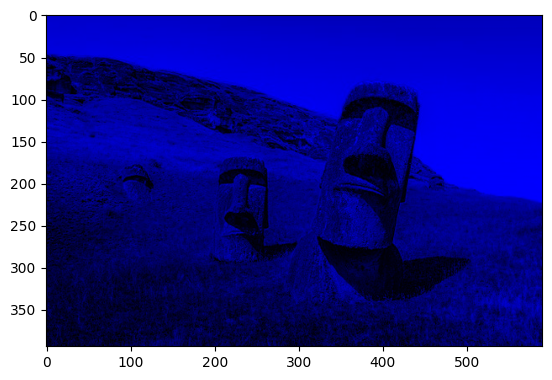

In [80]:
## TODO3
### Start
zeros = np.zeros(b.shape, np.uint8)
test_img2 = cv2.merge([zeros, zeros, b])
plt.imshow(test_img2)
### END

<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۶. عملیات حسابی بر روی تصاویر</b>
</font>

<br>
<p>
<font size=4>
OpenCV توابع زیادی برای انجام ریاضیات روی تصاویر دارد. برخی از این توابع «مشابه» در Numpy دارند، اما تقریباً همیشه بهتر است از نسخه OpenCV استفاده کنید. دلیل این امر این است که OpenCV برای کار بر روی تصاویر طراحی شده است و بنابراین Overflow را بهتر مدیریت می‌کند. در ادامه به چند مورد از این توابع اشاره خواهیم کرد.
</font>
</p>


</div>
</font>

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>اضافه کردن تصاویر به یکدیگر</b>
</font>

</div>
</font>

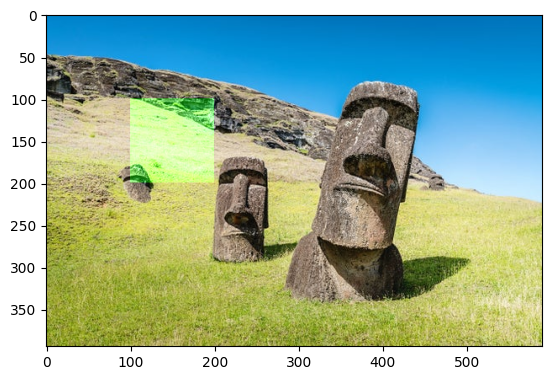

In [63]:
## Adding two images with the same size to each other:
blank_image = np.zeros((img2.shape), np.uint8)
blank_image[100:200,100:200,1] = 100 # make a green square in the blank image
# plt.imshow(blank_image) # if you want to check the blank_image first uncomment this line and comment the last line.
new_image=cv2.add(blank_image,img2) # add function which adds two images to each other.
plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=4>
همچنین می‌توان تصاویر را به صورت وزن دار به هم اضافه کرد یعنی:
$$Result = α · img1 + β · img2 + γ$$
</font>

</div>
</font>

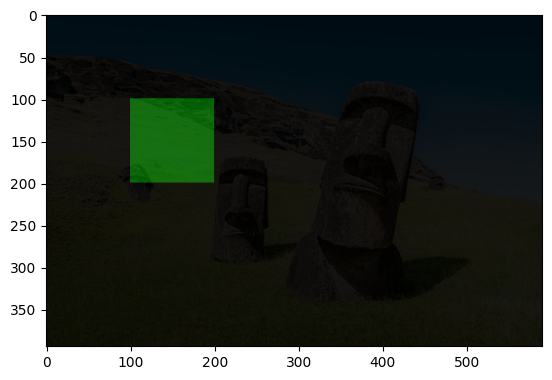

In [65]:
result = cv2.addWeighted(img2, 0.1, blank_image, 0.9, 0) # change the numbers
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۴</b>
</font>

<br>
<p align="justify">
<font size=4>
دو تصویر زیر را به نسبت دلخواه ترکیب کنید.

نکته: اندازه دو تصویر باید یکی باشند.
</font>
</p>

</div>
</font>

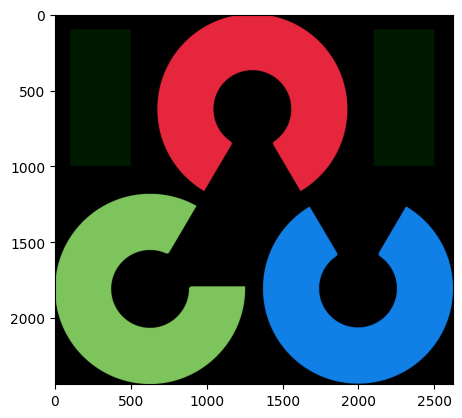

In [88]:
## TODO4
url1 = "https://github.com/opencv/opencv/wiki/logo/OpenCV_logo_no_text.png"
img1 = read_image_from_url(url1)
imag2 = np.zeros((img1.shape), np.uint8)
imag2[100:1000,100:500,1] = 255
imag2[100:1000,2100:2500,1] = 255
### START
res = cv2.addWeighted(imag2, 0.1, img1, 0.9, 0)
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))
### END

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>عملیات بیتی (Bitwise Operations)</b>
</font>

<br>
<p>
<font size=4>
شامل عملیات بیتی AND، OR، NOT و XOR می‌شود. هنگام استخراج هر قسمت از تصویر که  ناحیه‌هایی غیر مستطیلی است بسیار مفید خواهند بود. در زیر نمونه‌ای از نحوه تغییر یک منطقه خاص از یک تصویر را مشاهده خواهیم کرد.
</font>
</p>

</div>
</font>

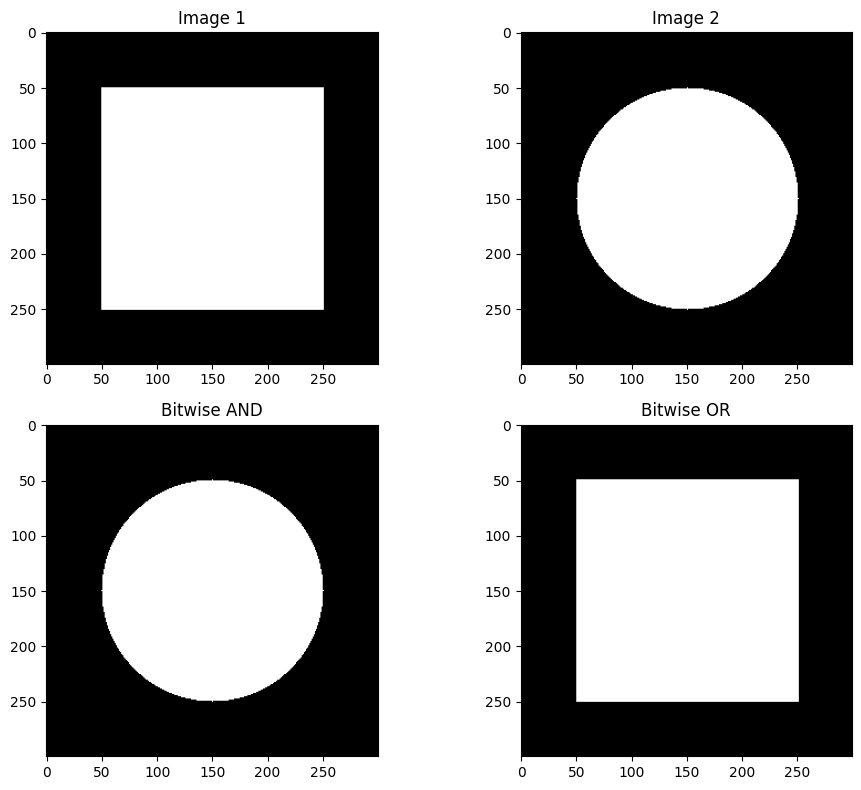

In [ ]:
img1 = np.zeros((300, 300), dtype=np.uint8)
img2 = np.zeros((300, 300), dtype=np.uint8)

# Draw a white rectangle on img1
cv2.rectangle(img1, (50, 50), (250, 250), 255, -1)

# Draw a white circle on img2
cv2.circle(img2, (150, 150), 100, 255, -1)

# Bitwise AND operation
bitwise_and = cv2.bitwise_and(img1, img2)

# Bitwise OR operation
bitwise_or = cv2.bitwise_or(img1, img2)

plt.figure(figsize=(10, 8))
plt.subplot(221), plt.imshow(img1, 'gray'), plt.title('Image 1')
plt.subplot(222), plt.imshow(img2, 'gray'), plt.title('Image 2')
plt.subplot(223), plt.imshow(bitwise_and, 'gray'), plt.title('Bitwise AND')
plt.subplot(224), plt.imshow(bitwise_or, 'gray'), plt.title('Bitwise OR')

plt.tight_layout()
plt.show()


<hr>
<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۷. عملیات ابتدایی در پردازش تصویر</b>
</font>

<br>
<p>
<font size=4>
حال که با عملیات ابتدایی در OpenCV آشنا شده‌اید قصد داریم کمی با عملیات ابتدایی در پردازش تصویر آشنا شویم.
</font>
</p>


</div>
</font>

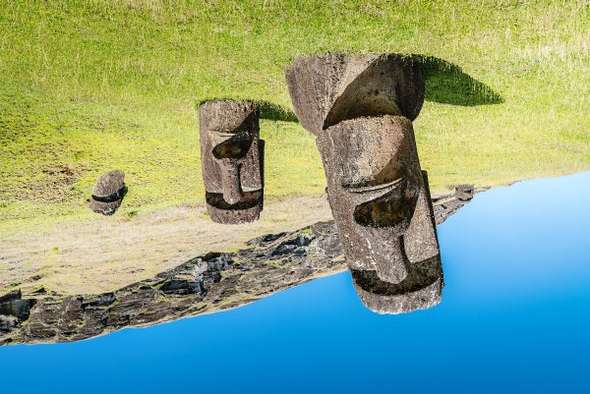

In [ ]:
flipped_code_0 = cv2.flip(img,0) # vertical flip
cv2_imshow(flipped_code_0)

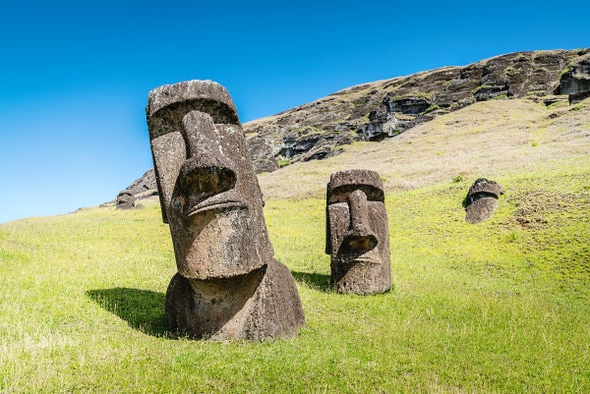

In [ ]:
flipped_code_1 = cv2.flip(img,1) # horizontal flip
cv2_imshow(flipped_code_1)

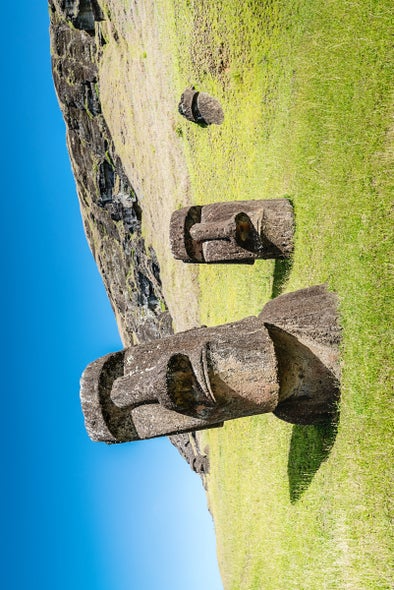

In [ ]:
transposed = cv2.transpose(img)
cv2_imshow(transposed)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۵</b>
</font>

<br>
<p align="justify">
<font size=4>
تابعی را پیاده‌سازی کنید که یک تصویر را با یک زاویه معین بدون استفاده از تابع‌ دوران در OpenCV و بدون نیاز به پرداختن به مسائل درونیابی یا برش یا تغییر اندازه مرز، دوران دهد.
<ol>
  <li>تابع باید یک تصویر و یک زاویه (به درجه) به عنوان ورودی دریافت کند.</li>
  <li>تابع باید تصویر دوران یافته را برگرداند.</li>
  <li>دوران در مرکز تصویر انجام می‌شود.</li>
  <li>بدلیل اینکه در این پیاده‌سازی از درونیابی استفاده نمی‌کنید ممکن است در تصویر دوران یافته نقاط سیاهی را مشاهده کنید.</li>
</ol>

<ol>
<font size=4>
راهنمایی:
  <li>یک نقطه (x,y) می‌تواند در حول مبدا (0,0) با یک زاویه θ با استفاده از معادلات زیر چرخیده شود: $$x' = x \cos(\theta) - y \sin(\theta)$$ $$y' = x \sin(\theta) + y \cos(\theta)$$</li>
  <li>برای دوران در حول مرکز تصویر، ابتدا تصویر را به گونه‌ای جابجا کنید که مرکز آن در مبدا قرار گیرد، سپس دوران را اعمال کنید و در نهایت آن را به مکان اصلی برگردانید.</li>
  <li>دقت کنید که زاویه باید به رادیان تبدیل شود.</li>
</font>
</ol>

</font>
</p>

</div>
</font>

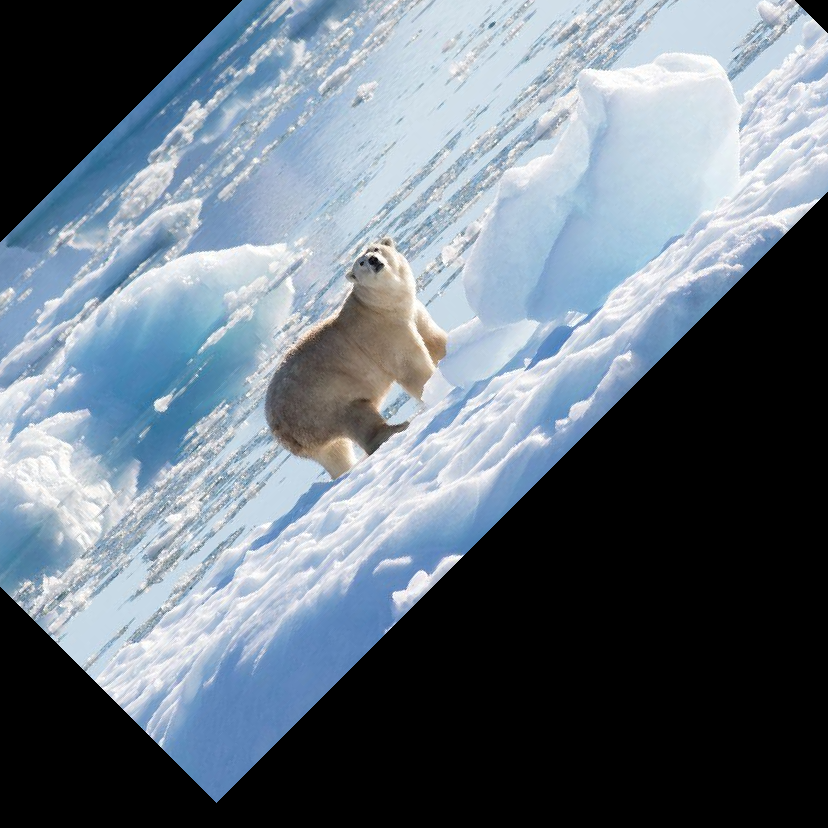

In [97]:
## TODO5:
def rotate_image(img, angle):
  ### START
  # convert the degrees into radians
    rad = math.radians(angle)

    rot = np.uint8(np.zeros(img.shape))

    # Finding the center point of rotated (or original) image.
    height = rot.shape[0]
    width  = rot.shape[1]

    midx,midy = (width//2, height//2)

    for i in range(rot.shape[0]):
        for j in range(rot.shape[1]):
            x= (i-midx)*math.cos(rad)+(j-midy)*math.sin(rad)
            y= -(i-midx)*math.sin(rad)+(j-midy)*math.cos(rad)

            x=round(x)+midx
            y=round(y)+midy

            if (x>=0 and y>=0 and x<image.shape[0] and  y<image.shape[1]):
                rot[i,j,:] = image[x,y,:]

    return rot
  ### END

test_url5 = "https://miro.medium.com/v2/resize:fit:828/format:webp/1*YMJDp-kqus7i-ktWtksNjg.jpeg"
test_img5 = read_image_from_url(test_url5)
rotated_img = rotate_image(test_img5, 45)
cv2_imshow(rotated_img)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>۸. کنتراست و روشنایی</b>
</font>

<br>
<p align="justify">
<font size=4>
کنتراست - تفاوت بین نواحی روشن و تاریک تصویر را کنترل می کند. کنتراست بالاتر باعث می شود نواحی روشن، روشن تر و نواحی تاریک، تاریک تر شوند. کنتراست پایین تر باعث می شود شدت پیکسل ها به حد میانی نزدیک تر شوند و تصویر، تخت تر و کمرنگ تر به نظر برسد.
</font>
</p>

</div>
</font>

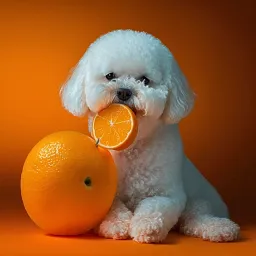

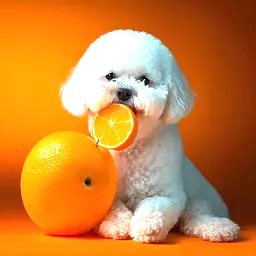

In [ ]:
test_url5 = "https://miro.medium.com/v2/resize:fit:256/format:webp/1*YMJDp-kqus7i-ktWtksNjg.jpeg"
test_img5 = read_image_from_url(test_url5)
contrast = 1.5 # increase contrast
adjusted = cv2.addWeighted(test_img5, contrast, 0, 0, 0)
cv2_imshow(test_img5)
cv2_imshow(adjusted)



<font face="B Mitra" size=5>
<div dir=rtl>

<br>
<p align="justify">
<font size=4>
روشنایی - روشنایی یا شدت کلی پیکسل ها را کنترل می کند. روشنایی بالاتر باعث می شود تصویر روشن تر یا "شسته شده" به نظر برسد. روشنایی پایین تر باعث می شود تصویر تاریک تر به نظر برسد.

روشنایی با اضافه یا کم کردن یک مقدار به شدت پیکسل ها تنظیم می شود. در OpenCV این کار با اضافه کردن یک عامل روشنایی به یک ماتریس صفر انجام می شود.

</font>
</p>

</div>
</font>

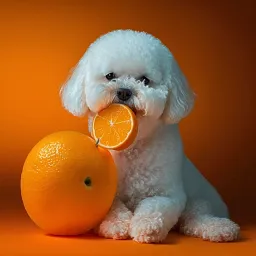

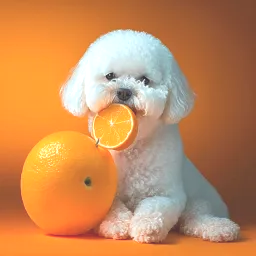

In [ ]:
test_img5 = read_image_from_url(test_url5)
brightness = 50 # increase brightness
brightened = cv2.addWeighted(test_img5, 1, np.zeros(test_img5.shape, dtype=test_img5.dtype), 0, brightness)
cv2_imshow(test_img5)
cv2_imshow(brightened)

<font face="B Mitra" size=5>
<div dir=rtl>

<font size=5>
<b>تمرین ۶</b>
</font>

<br>
<p align="justify">
<font size=4>
 تصویر زیر توسط پلیس راهور در شب گرفته شده. با استفاده از مفاهیم کنتراست و روشنایی، تصویری را به دست آورید که تشخیص ارقام داخل تصویر توسط چشم انسان ممکن باشد

</font>
</p>

</div>
</font>

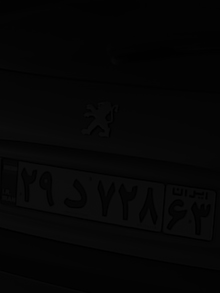

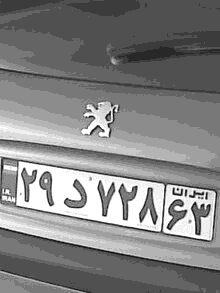

In [96]:
low_contrast_image = read_image_from_url("https://i.ibb.co/Brcmbyt/plate-night.png")
cv2_imshow(low_contrast_image)
contrast = 20
adjusted = cv2.addWeighted(low_contrast_image, contrast, 0, 0, 0)
brightness = 20
brightened = cv2.addWeighted(adjusted, 1, np.zeros(adjusted.shape, dtype=adjusted.dtype), 0, brightness)
cv2_imshow(brightened)